In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import(PowerNorm,LogNorm)
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
import os
import scipy.ndimage as snd
from scipy import signal
import astroalign as aa
from scipy.stats import mode
import glob

# Clear before running

# Read in Biases, Darks, and Flats

In [2]:
bias = fits.getdata('./Output/Bias.fits')
dark = fits.getdata('./Output/Dark.fits')

B_flat = fits.getdata('./Output/Flats/B_flat.fits')
R_flat = fits.getdata('./Output/Flats/R_flat.fits')
I_flat = fits.getdata('./Output/Flats/I_flat.fits')
V_flat = fits.getdata('./Output/Flats/V_flat.fits')
Ha_flat = fits.getdata('./Output/Flats/Ha_flat.fits')

# M51

In [3]:
#Get Data
B_filenames = np.array(glob.glob('./Final_Data/M51/B*'))
B_frames = []
for filename in B_filenames:
    B_frames.append(fits.getdata(filename))
    
R_filenames = np.array(glob.glob('./Final_Data/M51/R*'))
R_frames = []
for filename in R_filenames:
    R_frames.append(fits.getdata(filename))

I_filenames = np.array(glob.glob('./Final_Data/M51/I*'))
I_frames = []
for filename in I_filenames:
    I_frames.append(fits.getdata(filename))
    
V_filenames = np.array(glob.glob('./Final_Data/M51/V*'))
V_frames = []
for filename in V_filenames:
    V_frames.append(fits.getdata(filename))

Ha_filenames = np.array(glob.glob('./Final_Data/M51/Ha*'))
Ha_frames = []
for filename in Ha_filenames:
    Ha_frames.append(fits.getdata(filename))

print B_filenames
print R_filenames
print I_filenames
print V_filenames
print Ha_filenames

['./Final_Data/M51/B_100_02.fits' './Final_Data/M51/B_200_01.fits'
 './Final_Data/M51/B_200_02.fits' './Final_Data/M51/B_100_01.fits']
['./Final_Data/M51/R_120_01.fits' './Final_Data/M51/R_200_01.fits'
 './Final_Data/M51/R_200_02.fits' './Final_Data/M51/R_120_02.fits']
['./Final_Data/M51/I_150_02.fits' './Final_Data/M51/I_200_02.fits'
 './Final_Data/M51/I_150_03.fits' './Final_Data/M51/I_200_01.fits'
 './Final_Data/M51/I_150_01.fits']
['./Final_Data/M51/V_150_02.fits' './Final_Data/M51/V_200_02.fits'
 './Final_Data/M51/V_200_01.fits' './Final_Data/M51/V_150_01.fits']
['./Final_Data/M51/Ha_300_01.fits' './Final_Data/M51/Ha_300_03.fits'
 './Final_Data/M51/Ha_300_02.fits' './Final_Data/M51/Ha_300_05.fits'
 './Final_Data/M51/Ha_300_04.fits']


In [4]:
#Reduce Data
if B_frames:
    for i in range(len(B_frames)):
        dark_time = fits.getheader(np.array(glob.glob('./Final_Data/Dark/*'))[0])['EXPTIME']
        exp_time = fits.getheader(B_filenames[i])['EXPTIME']
        B_reduced = (B_frames-(dark-bias)*(exp_time/dark_time)-bias)/((B_flat-bias)/np.median(B_flat-bias))
    
if R_frames:
    for i in range(len(R_frames)):
        dark_time = fits.getheader(np.array(glob.glob('./Final_Data/Dark/*'))[0])['EXPTIME']
        exp_time = fits.getheader(R_filenames[i])['EXPTIME']
        R_reduced = (R_frames-(dark-bias)*(exp_time/dark_time)-bias)/((R_flat-bias)/np.median(R_flat-bias))

if I_frames:
    for i in range(len(I_frames)):
        dark_time = fits.getheader(np.array(glob.glob('./Final_Data/Dark/*'))[0])['EXPTIME']
        exp_time = fits.getheader(I_filenames[i])['EXPTIME']
        I_reduced = (I_frames-(dark-bias)*(exp_time/dark_time)-bias)/((I_flat-bias)/np.median(I_flat-bias))
    
if V_frames:
    for i in range(len(V_frames)):
        dark_time = fits.getheader(np.array(glob.glob('./Final_Data/Dark/*'))[0])['EXPTIME']
        exp_time = fits.getheader(V_filenames[i])['EXPTIME']
        V_reduced = (V_frames-(dark-bias)*(exp_time/dark_time)-bias)/((V_flat-bias)/np.median(V_flat-bias))
    
if Ha_frames:
    for i in range(len(Ha_frames)):
        dark_time = fits.getheader(np.array(glob.glob('./Final_Data/Dark/*'))[0])['EXPTIME']
        exp_time = fits.getheader(Ha_filenames[i])['EXPTIME']
        Ha_reduced = (Ha_frames-(dark-bias)*(exp_time/dark_time)-bias)/((Ha_flat-bias)/np.median(Ha_flat-bias))


In [5]:
if B_frames:  
    B_stats_raw = np.ndarray((len(B_frames),3))
    B_medians_raw = np.ndarray(len(B_frames))
    B_sigmas_raw = np.ndarray(len(B_frames))
    for i in range(len(B_frames)):
        B_stats_raw[i] = sigma_clipped_stats(B_frames[i],sigma=3,iters=3)
        B_medians_raw[i] = B_stats_raw[i][1]
        B_sigmas_raw[i] = B_stats_raw[i][2]   
    print 'B'
    print B_medians_raw
    print B_sigmas_raw
    
if R_frames:
    R_stats_raw = np.ndarray((len(R_frames),3))
    R_medians_raw = np.ndarray(len(R_frames))
    R_sigmas_raw = np.ndarray(len(R_frames))
    for i in range(len(R_frames)):
        R_stats_raw[i] = sigma_clipped_stats(R_frames[i],sigma=3,iters=3)
        R_medians_raw[i] = R_stats_raw[i][1]
        R_sigmas_raw[i] = R_stats_raw[i][2]   
    print '\n R'
    print R_medians_raw
    print R_sigmas_raw
    
if I_frames:
    I_stats_raw = np.ndarray((len(I_frames),3))
    I_medians_raw = np.ndarray(len(I_frames))
    I_sigmas_raw = np.ndarray(len(I_frames))
    for i in range(len(I_frames)):
        I_stats_raw[i] = sigma_clipped_stats(I_frames[i],sigma=3,iters=3)
        I_medians_raw[i] = I_stats_raw[i][1]
        I_sigmas_raw[i] = I_stats_raw[i][2]   
    print '\n I'
    print I_medians_raw
    print I_sigmas_raw

if V_frames:
    V_stats_raw = np.ndarray((len(V_frames),3))
    V_medians_raw = np.ndarray(len(V_frames))
    V_sigmas_raw = np.ndarray(len(V_frames))
    for i in range(len(V_frames)):
        V_stats_raw[i] = sigma_clipped_stats(V_frames[i],sigma=3,iters=3)
        V_medians_raw[i] = V_stats_raw[i][1]
        V_sigmas_raw[i] = V_stats_raw[i][2]   
    print '\n V'       
    print V_medians_raw
    print V_sigmas_raw
    
if Ha_frames:
    Ha_stats_raw = np.ndarray((len(Ha_frames),3))
    Ha_medians_raw = np.ndarray(len(Ha_frames))
    Ha_sigmas_raw = np.ndarray(len(Ha_frames))
    for i in range(len(Ha_frames)):
        Ha_stats_raw[i] = sigma_clipped_stats(Ha_frames[i],sigma=3,iters=3)
        Ha_medians_raw[i] = Ha_stats_raw[i][1]
        Ha_sigmas_raw[i] = Ha_stats_raw[i][2]   
    print '\n Ha'
    print Ha_medians_raw
    print Ha_sigmas_raw
    

B
[ 1578.  1879.  1878.  1581.]
[ 25.16504386  40.89333257  40.83123482  25.39019958]

 R
[ 2445.  3068.  3070.  2448.]
[  69.35898078  101.17068461  101.2181512    69.57563426]

 I
[ 1554.  1666.  1550.  1669.  1551.]
[ 26.94670271  33.42681256  26.56021875  33.5581814   26.78930898]

 V
[ 2624.  2943.  2955.  2626.]
[ 78.67725388  95.19626095  95.53358798  78.80318991]

 Ha
[ 1315.  1309.  1310.  1314.  1316.]
[ 13.35115545  13.05993261  13.16434687  13.43193479  13.48277565]


In [6]:
if B_frames:  
    B_stats = np.ndarray((len(B_frames),3))
    B_medians = np.ndarray(len(B_frames))
    B_sigmas = np.ndarray(len(B_frames))
    for i in range(len(B_frames)):
        B_stats[i] = sigma_clipped_stats(B_reduced[i],sigma=3,iters=3)
        B_medians[i] = B_stats[i][1]
        B_sigmas[i] = B_stats[i][2]   
    print 'B'
    print B_medians
    print B_sigmas
    
if R_frames:
    R_stats = np.ndarray((len(R_frames),3))
    R_medians = np.ndarray(len(R_frames))
    R_sigmas = np.ndarray(len(R_frames))
    for i in range(len(R_frames)):
        R_stats[i] = sigma_clipped_stats(R_reduced[i],sigma=3,iters=3)
        R_medians[i] = R_stats[i][1]
        R_sigmas[i] = R_stats[i][2]   
    print '\n R'
    print R_medians
    print R_sigmas
    
if I_frames:
    I_stats = np.ndarray((len(I_frames),3))
    I_medians = np.ndarray(len(I_frames))
    I_sigmas = np.ndarray(len(I_frames))
    for i in range(len(I_frames)):
        I_stats[i] = sigma_clipped_stats(I_reduced[i],sigma=3,iters=3)
        I_medians[i] = I_stats[i][1]
        I_sigmas[i] = I_stats[i][2]   
    print '\n I'
    print I_medians
    print I_sigmas

if V_frames:
    V_stats = np.ndarray((len(V_frames),3))
    V_medians = np.ndarray(len(V_frames))
    V_sigmas = np.ndarray(len(V_frames))
    for i in range(len(V_frames)):
        V_stats[i] = sigma_clipped_stats(V_reduced[i],sigma=3,iters=3)
        V_medians[i] = V_stats[i][1]
        V_sigmas[i] = V_stats[i][2]   
    print '\n V'       
    print V_medians
    print V_sigmas
    
if Ha_frames:
    Ha_stats = np.ndarray((len(Ha_frames),3))
    Ha_medians = np.ndarray(len(Ha_frames))
    Ha_sigmas = np.ndarray(len(Ha_frames))
    for i in range(len(Ha_frames)):
        Ha_stats[i] = sigma_clipped_stats(Ha_reduced[i],sigma=3,iters=3)
        Ha_medians[i] = Ha_stats[i][1]
        Ha_sigmas[i] = Ha_stats[i][2]   
    print '\n Ha'
    print Ha_medians
    print Ha_sigmas
    

B
[ 344.65683385  648.18395242  647.23532075  347.45904878]
[ 18.47626445  26.90872125  26.90697589  18.54117343]

 R
[ 1216.27759494  1842.48282563  1844.76607149  1219.55633217]
[ 35.65498156  49.10819178  48.90974075  35.70977312]

 I
[ 319.14901747  431.94811757  315.49147124  435.58961585  316.83306235]
[ 19.05359995  22.41152383  18.69409378  22.54949743  18.91692466]

 V
[ 1394.54903973  1714.98109828  1726.64190271  1396.87866358]
[ 37.87462704  44.7179176   44.82581562  37.95241275]

 Ha
[ 75.21307662  69.09682436  70.56059573  73.86909937  76.21893561]
[ 12.75142659  12.6390956   12.66853927  12.83374434  12.89408122]


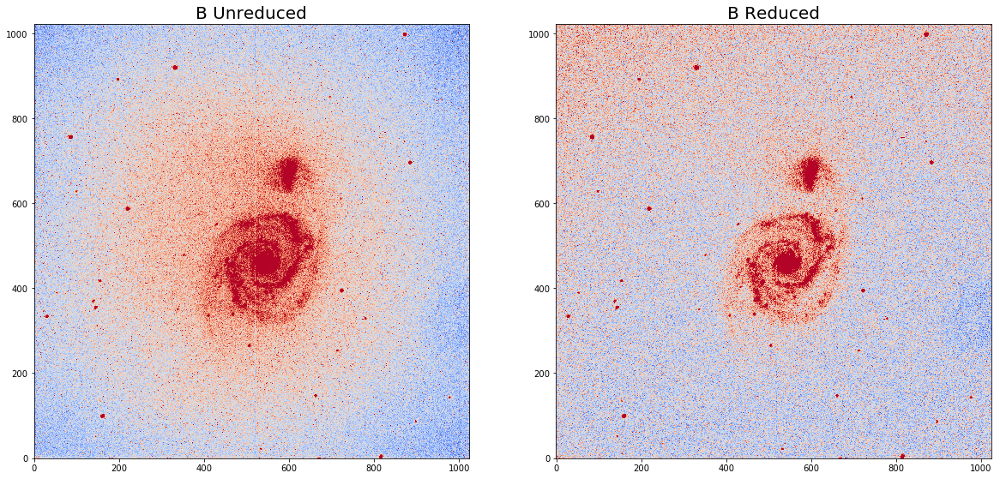

In [7]:
fig = plt.figure(figsize=((20,20)))
if B_frames:
    plt.subplot(121)
    plt.title('B Unreduced', fontsize=20)
    plt.imshow(B_frames[0],vmin=B_medians_raw[0]-3*B_sigmas_raw[0],vmax=B_medians_raw[0]+3*B_sigmas_raw[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.subplot(122)
    plt.title('B Reduced', fontsize=20)
    plt.imshow(B_reduced[0],vmin=B_medians[0]-3*B_sigmas[0],vmax=B_medians[0]+3*B_sigmas[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.show()

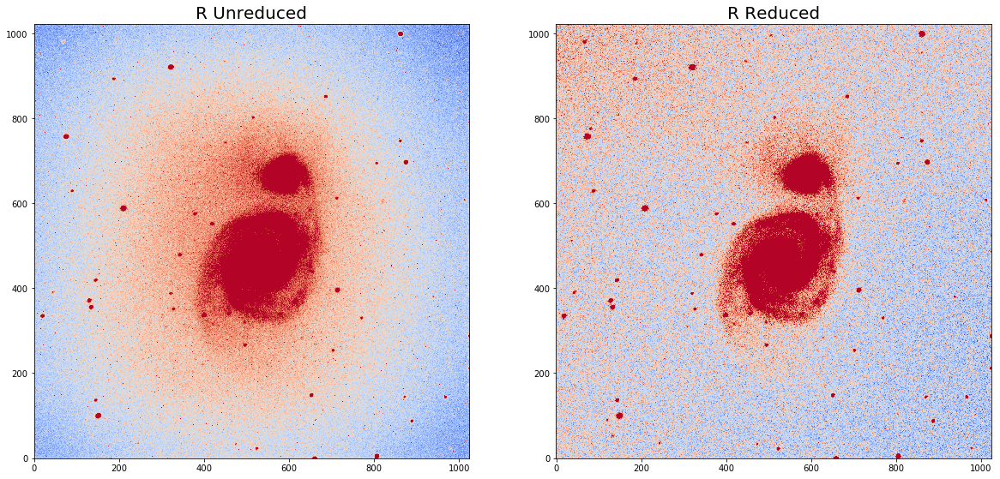

In [8]:
fig = plt.figure(figsize=((20,20)))
if R_frames:
    plt.subplot(121)
    plt.title('R Unreduced', fontsize=20)
    plt.imshow(R_frames[0],vmin=R_medians_raw[0]-3*R_sigmas_raw[0],vmax=R_medians_raw[0]+3*R_sigmas_raw[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.subplot(122)
    plt.title('R Reduced', fontsize=20)
    plt.imshow(R_reduced[0],vmin=R_medians[0]-3*R_sigmas[0],vmax=R_medians[0]+3*R_sigmas[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.show()

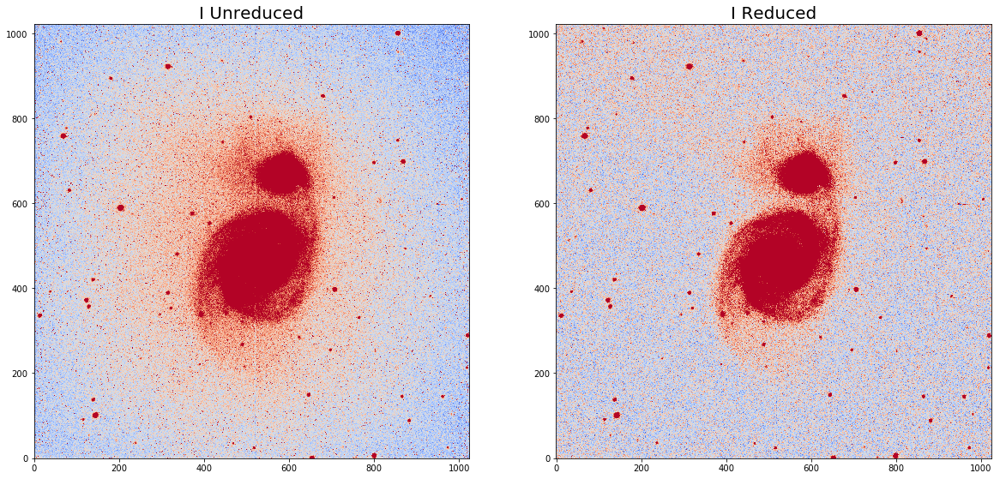

In [9]:
fig = plt.figure(figsize=((20,20)))
if I_frames:
    plt.subplot(121)
    plt.title('I Unreduced', fontsize=20)
    plt.imshow(I_frames[0],vmin=I_medians_raw[0]-3*I_sigmas_raw[0],vmax=I_medians_raw[0]+3*I_sigmas_raw[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.subplot(122)
    plt.title('I Reduced', fontsize=20)
    plt.imshow(I_reduced[0],vmin=I_medians[0]-3*I_sigmas[0],vmax=I_medians[0]+3*I_sigmas[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.show()

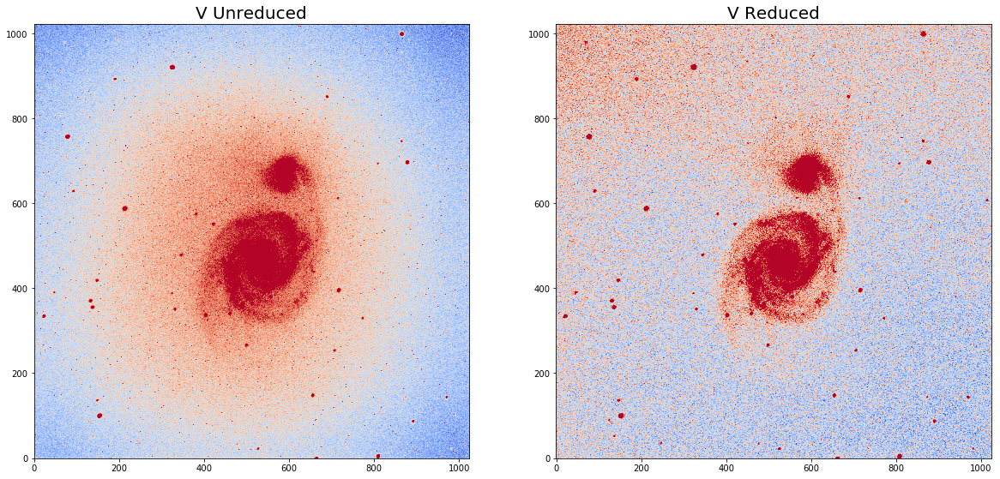

In [10]:
fig = plt.figure(figsize=((20,20)))
if V_frames:
    plt.subplot(121)
    plt.title('V Unreduced', fontsize=20)
    plt.imshow(V_frames[0],vmin=V_medians_raw[0]-3*V_sigmas_raw[0],vmax=V_medians_raw[0]+3*V_sigmas_raw[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.subplot(122)
    plt.title('V Reduced', fontsize=20)
    plt.imshow(V_reduced[0],vmin=V_medians[0]-3*V_sigmas[0],vmax=V_medians[0]+3*V_sigmas[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.show()

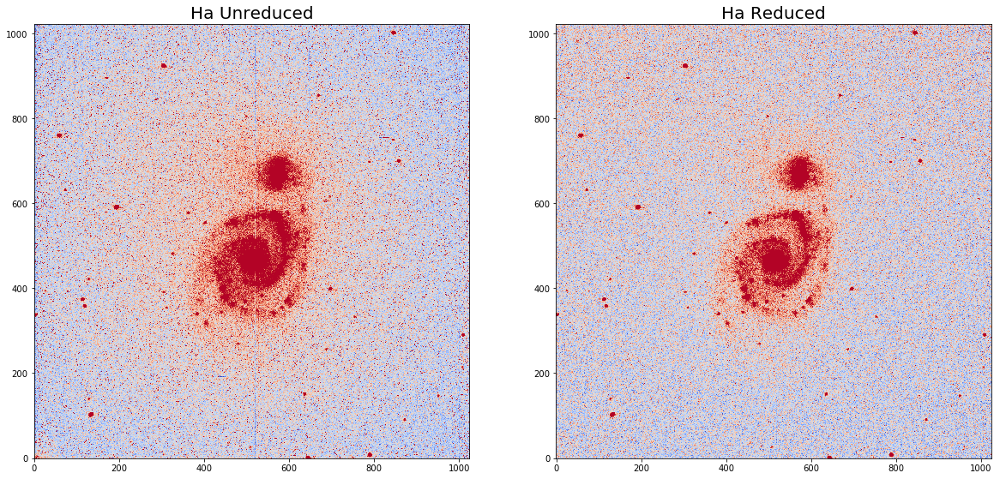

In [11]:
fig = plt.figure(figsize=((20,20)))
if Ha_frames:
    plt.subplot(121)
    plt.title('Ha Unreduced', fontsize=20)
    plt.imshow(Ha_frames[0],vmin=Ha_medians_raw[0]-3*Ha_sigmas_raw[0],vmax=Ha_medians_raw[0]+3*Ha_sigmas_raw[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.subplot(122)
    plt.title('Ha Reduced', fontsize=20)
    plt.imshow(Ha_reduced[0],vmin=Ha_medians[0]-3*Ha_sigmas[0],vmax=Ha_medians[0]+3*Ha_sigmas[0],cmap=plt.cm.coolwarm, origin='lower')
    plt.show()

B Sky
[338.0, 644.0, 644.0, 344.0]


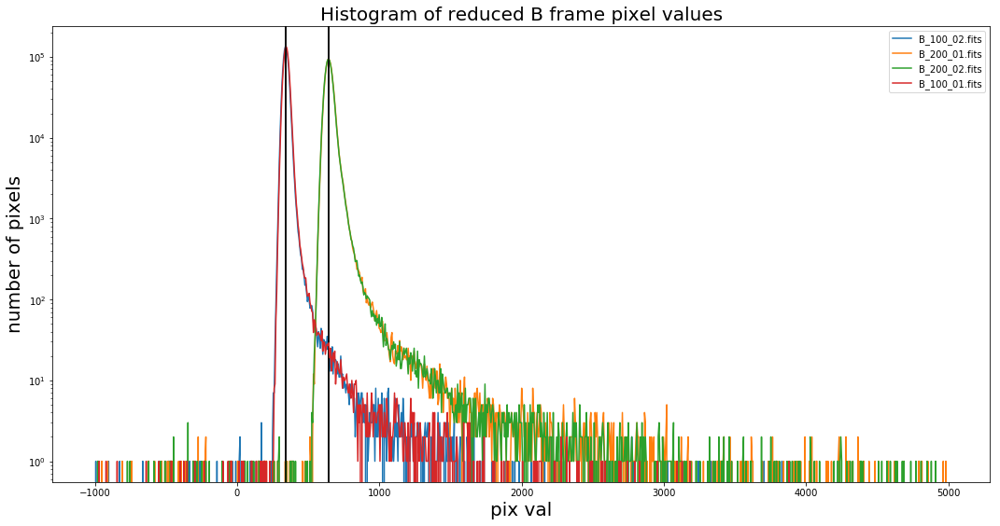

R Sky
[1214.0, 1832.0, 1838.0, 1214.0]


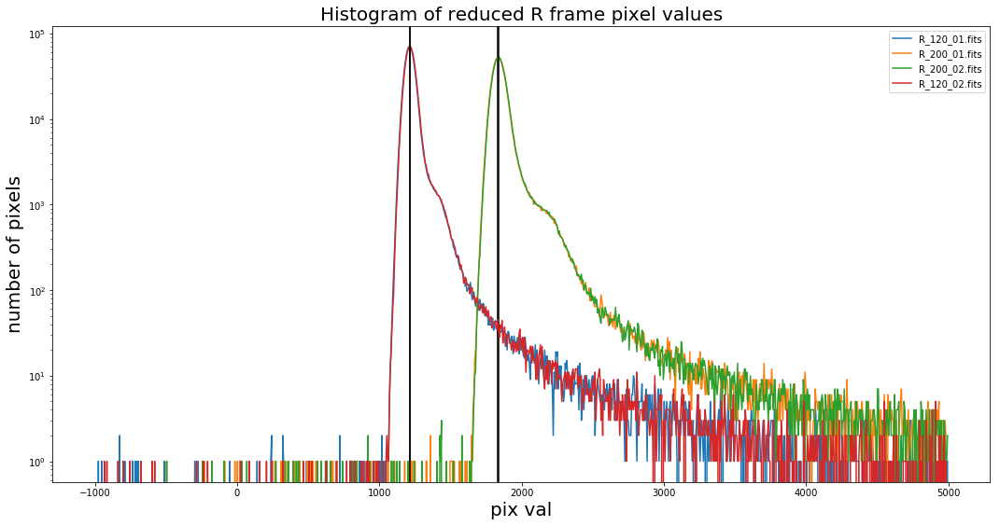

I Sky
[314.0, 428.0, 314.0, 428.0, 314.0]


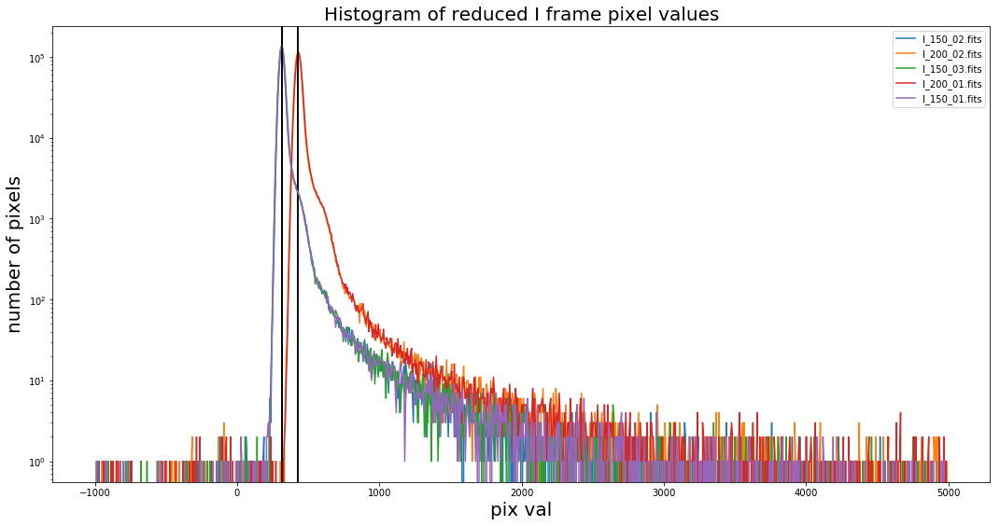

V Sky
[1388.0, 1706.0, 1718.0, 1388.0]


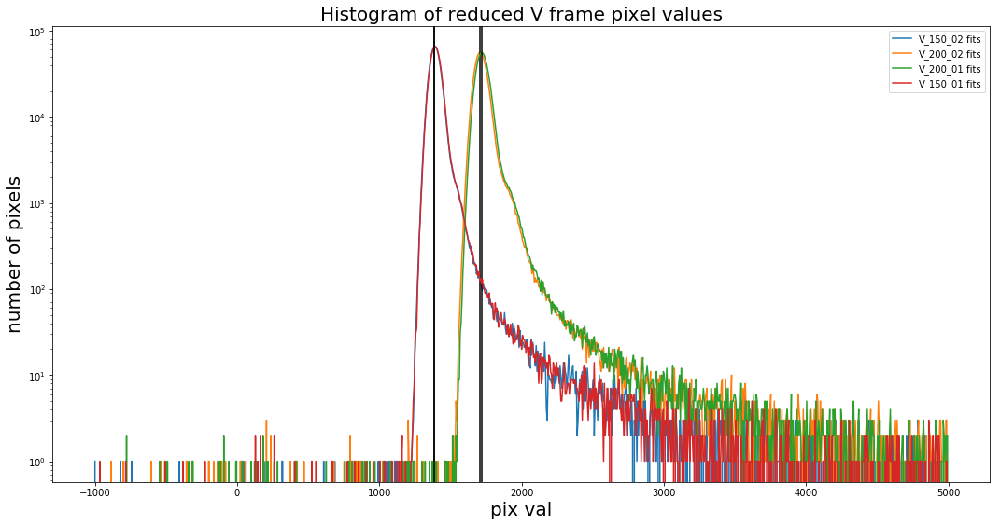

Ha Sky
[74.0, 68.0, 68.0, 68.0, 74.0]


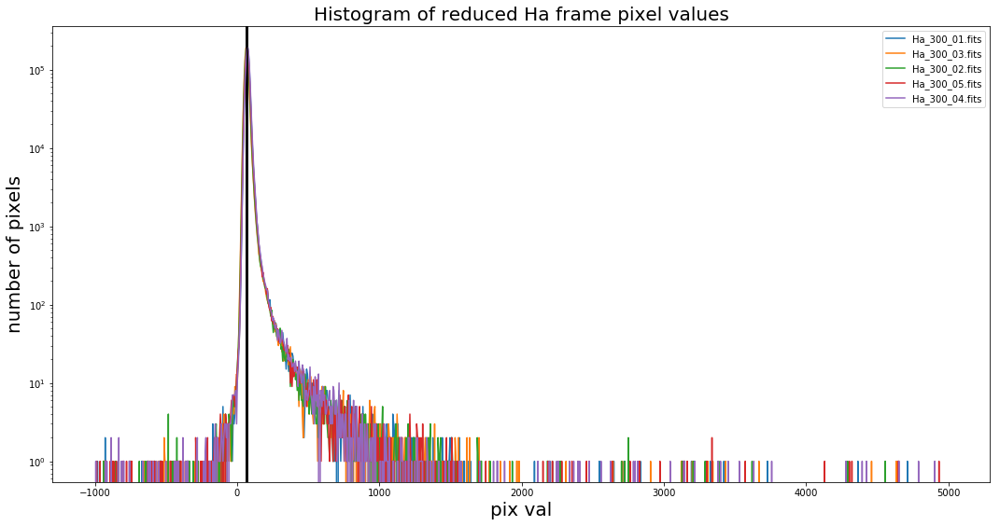

In [12]:
if B_frames:
    plt.figure(figsize=(18,9))
    B_skylevels=[]
    for i in range(len(B_reduced)):
        numpix,aduvals=np.histogram(B_reduced[i].flatten(),bins=1000,range=[-1e3,5e3])
        skylevel=aduvals[np.where(numpix==numpix.max())][0]
        B_skylevels.append(skylevel)
        plt.plot(aduvals[:-1],numpix,label=str(B_filenames[i].split('/')[-1]))
        plt.axvline(skylevel,color='k')
    plt.xlabel('pix val',fontsize=20)
    plt.ylabel('number of pixels',fontsize=20)
    plt.yscale('log')
    plt.legend()
    print 'B Sky'
    print (B_skylevels)
    plt.title('Histogram of reduced B frame pixel values',fontsize=20)
    plt.show()

if R_frames:
    plt.figure(figsize=(18,9))
    R_skylevels=[]
    for i in range(len(R_reduced)):
        numpix,aduvals=np.histogram(R_reduced[i].flatten(),bins=1000,range=[-1e3,5e3])
        skylevel=aduvals[np.where(numpix==numpix.max())][0]
        R_skylevels.append(skylevel)
        plt.plot(aduvals[:-1],numpix,label=str(R_filenames[i].split('/')[-1]))
        plt.axvline(skylevel,color='k')
    plt.xlabel('pix val',fontsize=20)
    plt.ylabel('number of pixels',fontsize=20)
    plt.yscale('log')
    plt.legend()
    print 'R Sky'
    print (R_skylevels)
    plt.title('Histogram of reduced R frame pixel values',fontsize=20)
    plt.show()
    
if I_frames:
    plt.figure(figsize=(18,9))
    I_skylevels=[]
    for i in range(len(I_reduced)):
        numpix,aduvals=np.histogram(I_reduced[i].flatten(),bins=1000,range=[-1e3,5e3])
        skylevel=aduvals[np.where(numpix==numpix.max())][0]
        I_skylevels.append(skylevel)
        plt.plot(aduvals[:-1],numpix,label=str(I_filenames[i].split('/')[-1]))
        plt.axvline(skylevel,color='k')
    plt.xlabel('pix val',fontsize=20)
    plt.ylabel('number of pixels',fontsize=20)
    plt.yscale('log')
    plt.legend()
    print 'I Sky'
    print (I_skylevels)
    plt.title('Histogram of reduced I frame pixel values',fontsize=20)
    plt.show()
    
if V_frames:
    plt.figure(figsize=(18,9))
    V_skylevels=[]
    for i in range(len(V_reduced)):
        numpix,aduvals=np.histogram(V_reduced[i].flatten(),bins=1000,range=[-1e3,5e3])
        skylevel=aduvals[np.where(numpix==numpix.max())][0]
        V_skylevels.append(skylevel)
        plt.plot(aduvals[:-1],numpix,label=str(V_filenames[i].split('/')[-1]))
        plt.axvline(skylevel,color='k')
    plt.xlabel('pix val',fontsize=20)
    plt.ylabel('number of pixels',fontsize=20)
    plt.yscale('log')
    plt.legend()
    print 'V Sky'
    print (V_skylevels)
    plt.title('Histogram of reduced V frame pixel values',fontsize=20)
    plt.show()
    
if Ha_frames:
    plt.figure(figsize=(18,9))
    Ha_skylevels=[]
    for i in range(len(Ha_reduced)):
        numpix,aduvals=np.histogram(Ha_reduced[i].flatten(),bins=1000,range=[-1e3,5e3])
        skylevel=aduvals[np.where(numpix==numpix.max())][0]
        Ha_skylevels.append(skylevel)
        plt.plot(aduvals[:-1],numpix,label=str(Ha_filenames[i].split('/')[-1]))
        plt.axvline(skylevel,color='k')
    plt.xlabel('pix val',fontsize=20)
    plt.ylabel('number of pixels',fontsize=20)
    plt.yscale('log')
    plt.legend()
    print 'Ha Sky'
    print (Ha_skylevels)
    plt.title('Histogram of reduced Ha frame pixel values',fontsize=20)
    plt.show()

In [13]:
if B_frames:
    B_final = np.empty_like(B_reduced)
    for i in range(len(B_reduced)):
        B_final[i]=B_reduced[i]-np.full((1024,1024),fill_value=B_skylevels[i])
    
if R_frames:
    R_final = np.empty_like(R_reduced)
    for i in range(len(R_reduced)):
        R_final[i]=R_reduced[i]-np.full((1024,1024),fill_value=R_skylevels[i])
    
if I_frames:
    I_final = np.empty_like(I_reduced)
    for i in range(len(I_reduced)):
        I_final[i]=I_reduced[i]-np.full((1024,1024),fill_value=I_skylevels[i])
    
if V_frames:
    V_final = np.empty_like(V_reduced)
    for i in range(len(V_reduced)):
        V_final[i]=V_reduced[i]-np.full((1024,1024),fill_value=V_skylevels[i])
    
if Ha_frames:
    Ha_final = np.empty_like(Ha_reduced)
    for i in range(len(Ha_reduced)):
        Ha_final[i]=Ha_reduced[i]-np.full((1024,1024),fill_value=Ha_skylevels[i])

In [14]:
if B_frames:  
    B_stats_fin = np.ndarray((len(B_frames),3))
    B_medians_fin = np.ndarray(len(B_frames))
    B_sigmas_fin = np.ndarray(len(B_frames))
    for i in range(len(B_frames)):
        B_stats_fin[i] = sigma_clipped_stats(B_final[i],sigma=3,iters=3)
        B_medians_fin[i] = B_stats_fin[i][1]
        B_sigmas_fin[i] = B_stats_fin[i][2]   
    print 'B'
    print B_medians_fin
    print B_sigmas_fin
    
if R_frames:
    R_stats_fin = np.ndarray((len(R_frames),3))
    R_medians_fin = np.ndarray(len(R_frames))
    R_sigmas_fin = np.ndarray(len(R_frames))
    for i in range(len(R_frames)):
        R_stats_fin[i] = sigma_clipped_stats(R_final[i],sigma=3,iters=3)
        R_medians_fin[i] = R_stats_fin[i][1]
        R_sigmas_fin[i] = R_stats_fin[i][2]   
    print '\n R'
    print R_medians_fin
    print R_sigmas_fin
    
if I_frames:
    I_stats_fin = np.ndarray((len(I_frames),3))
    I_medians_fin = np.ndarray(len(I_frames))
    I_sigmas_fin = np.ndarray(len(I_frames))
    for i in range(len(I_frames)):
        I_stats_fin[i] = sigma_clipped_stats(I_final[i],sigma=3,iters=3)
        I_medians_fin[i] = I_stats_fin[i][1]
        I_sigmas_fin[i] = I_stats_fin[i][2]   
    print '\n I'
    print I_medians_fin
    print I_sigmas_fin

if V_frames:
    V_stats_fin = np.ndarray((len(V_frames),3))
    V_medians_fin = np.ndarray(len(V_frames))
    V_sigmas_fin = np.ndarray(len(V_frames))
    for i in range(len(V_frames)):
        V_stats_fin[i] = sigma_clipped_stats(V_final[i],sigma=3,iters=3)
        V_medians_fin[i] = V_stats_fin[i][1]
        V_sigmas_fin[i] = V_stats_fin[i][2]   
    print '\n V'       
    print V_medians_fin
    print V_sigmas_fin
    
if Ha_frames:
    Ha_stats_fin = np.ndarray((len(Ha_frames),3))
    Ha_medians_fin = np.ndarray(len(Ha_frames))
    Ha_sigmas_fin = np.ndarray(len(Ha_frames))
    for i in range(len(Ha_frames)):
        Ha_stats_fin[i] = sigma_clipped_stats(Ha_final[i],sigma=3,iters=3)
        Ha_medians_fin[i] = Ha_stats_fin[i][1]
        Ha_sigmas_fin[i] = Ha_stats_fin[i][2]   
    print '\n Ha'
    print Ha_medians_fin
    print Ha_sigmas_fin
    

B
[ 6.65683385  4.18395242  3.23532075  3.45904878]
[ 18.47626445  26.90872125  26.90697589  18.54117343]

 R
[  2.27759494  10.48282563   6.76607149   5.55633217]
[ 35.65498156  49.10819178  48.90974075  35.70977312]

 I
[ 5.14901747  3.94811757  1.49147124  7.58961585  2.83306235]
[ 19.05359995  22.41152383  18.69409378  22.54949743  18.91692466]

 V
[ 6.54903973  8.98109828  8.64190271  8.87866358]
[ 37.87462704  44.7179176   44.82581562  37.95241275]

 Ha
[ 1.21307662  1.09682436  2.56059573  5.86909937  2.21893561]
[ 12.75142659  12.6390956   12.66853927  12.83374434  12.89408122]


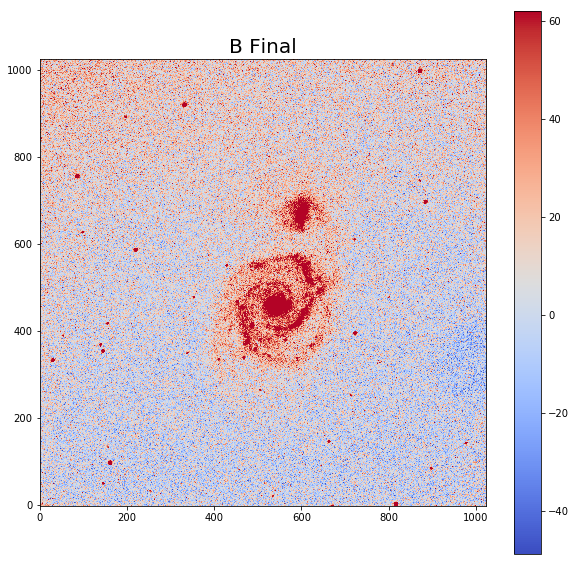

In [15]:
fig = plt.figure(figsize=((10,10)))
plt.title('B Final', fontsize=20)
plt.imshow(B_final[0],vmin=B_medians_fin[0]-3*B_sigmas_fin[0],vmax=B_medians_fin[0]+3*B_sigmas_fin[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

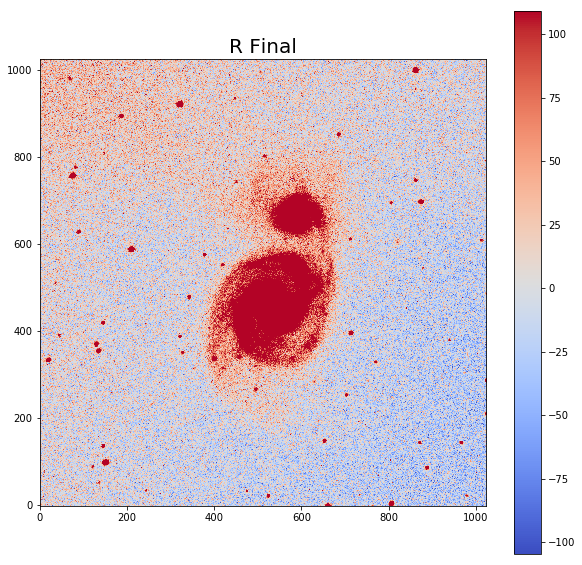

In [16]:
fig = plt.figure(figsize=((10,10)))
plt.title('R Final', fontsize=20)
plt.imshow(R_final[0],vmin=R_medians_fin[0]-3*R_sigmas_fin[0],vmax=R_medians_fin[0]+3*R_sigmas_fin[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

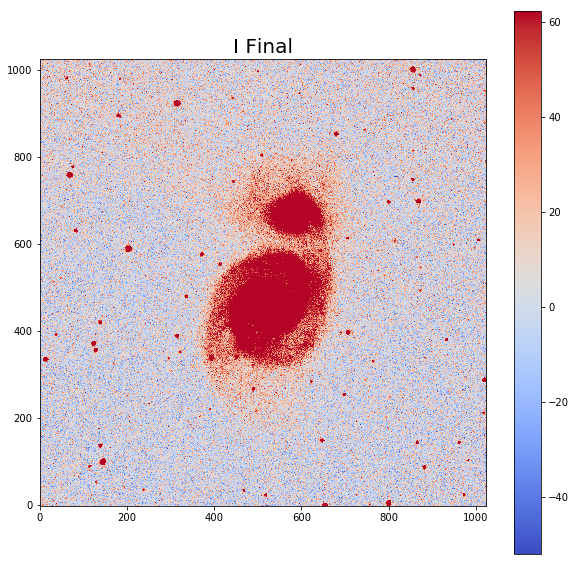

In [17]:
fig = plt.figure(figsize=((10,10)))
plt.title('I Final', fontsize=20)
plt.imshow(I_final[0],vmin=I_medians_fin[0]-3*I_sigmas_fin[0],vmax=I_medians_fin[0]+3*I_sigmas_fin[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

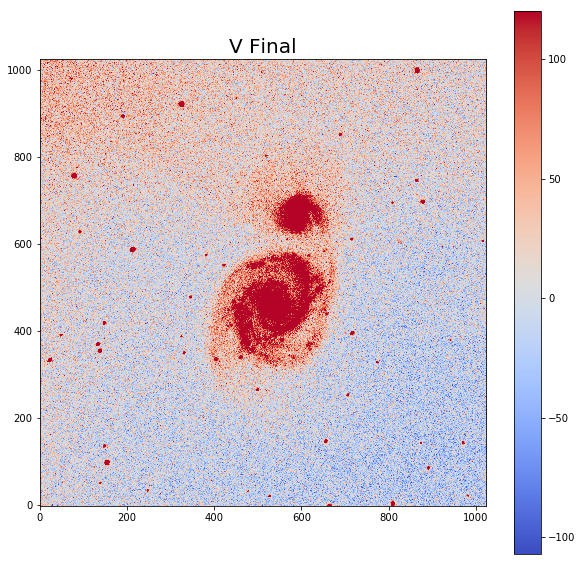

In [18]:
fig = plt.figure(figsize=((10,10)))
plt.title('V Final', fontsize=20)
plt.imshow(V_final[0],vmin=V_medians_fin[0]-3*V_sigmas_fin[0],vmax=V_medians_fin[0]+3*V_sigmas_fin[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

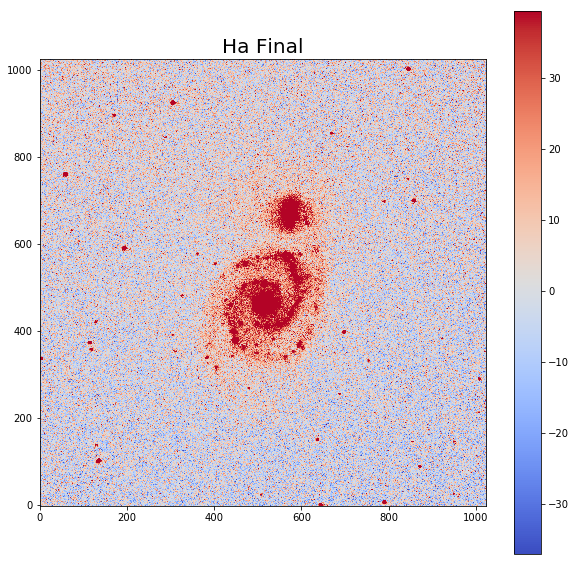

In [19]:
fig = plt.figure(figsize=((10,10)))
plt.title('Ha Final', fontsize=20)
plt.imshow(Ha_final[0],vmin=Ha_medians_fin[0]-3*Ha_sigmas_fin[0],vmax=Ha_medians_fin[0]+3*Ha_sigmas_fin[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

In [20]:
B = np.empty_like(B_final)
R = np.empty_like(R_final)
I = np.empty_like(I_final)
V = np.empty_like(V_final)
Ha = np.empty_like(Ha_final)

for i in range(len(B_final)):
    exp_time = fits.getheader(B_filenames[i])['EXPTIME']
    B[i] = B_final[i]/exp_time

for i in range(len(R_final)):
    exp_time = fits.getheader(R_filenames[i])['EXPTIME']
    R[i] = R_final[i]/exp_time
    
for i in range(len(I_final)):
    exp_time = fits.getheader(I_filenames[i])['EXPTIME']
    I[i] = I_final[i]/exp_time
    
for i in range(len(V_final)):
    exp_time = fits.getheader(V_filenames[i])['EXPTIME']
    V[i] = V_final[i]/exp_time
    
for i in range(len(Ha_final)):
    exp_time = fits.getheader(Ha_filenames[i])['EXPTIME']
    Ha[i] = Ha_final[i]/exp_time


In [21]:
if B_frames:  
    B_stat = np.ndarray((len(B_frames),3))
    B_median = np.ndarray(len(B_frames))
    B_sigma = np.ndarray(len(B_frames))
    for i in range(len(B_frames)):
        B_stat[i] = sigma_clipped_stats(B[i],sigma=3,iters=3)
        B_median[i] = B_stat[i][1]
        B_sigma[i] = B_stat[i][2]   
    print 'B'
    print B_median
    print B_sigma
    
if R_frames:
    R_stat = np.ndarray((len(R_frames),3))
    R_median = np.ndarray(len(R_frames))
    R_sigma = np.ndarray(len(R_frames))
    for i in range(len(R_frames)):
        R_stat[i] = sigma_clipped_stats(R[i],sigma=3,iters=3)
        R_median[i] = R_stat[i][1]
        R_sigma[i] = R_stat[i][2]   
    print '\n R'
    print R_median
    print R_sigma
    
if I_frames:
    I_stat = np.ndarray((len(I_frames),3))
    I_median = np.ndarray(len(I_frames))
    I_sigma = np.ndarray(len(I_frames))
    for i in range(len(I_frames)):
        I_stat[i] = sigma_clipped_stats(I[i],sigma=3,iters=3)
        I_median[i] = I_stat[i][1]
        I_sigma[i] = I_stat[i][2]   
    print '\n I'
    print I_median
    print I_sigma

if V_frames:
    V_stat = np.ndarray((len(V_frames),3))
    V_median = np.ndarray(len(V_frames))
    V_sigma = np.ndarray(len(V_frames))
    for i in range(len(V_frames)):
        V_stat[i] = sigma_clipped_stats(V[i],sigma=3,iters=3)
        V_median[i] = V_stat[i][1]
        V_sigma[i] = V_stat[i][2]   
    print '\n V'       
    print V_median
    print V_sigma
    
if Ha_frames:
    Ha_stat = np.ndarray((len(Ha_frames),3))
    Ha_median = np.ndarray(len(Ha_frames))
    Ha_sigma = np.ndarray(len(Ha_frames))
    for i in range(len(Ha_frames)):
        Ha_stat[i] = sigma_clipped_stats(Ha[i],sigma=3,iters=3)
        Ha_median[i] = Ha_stat[i][1]
        Ha_sigma[i] = Ha_stat[i][2]   
    print '\n Ha'
    print Ha_median
    print Ha_sigma
    

B
[ 0.06656834  0.02091976  0.0161766   0.03459049]
[ 0.18476264  0.13454361  0.13453488  0.18541173]

 R
[ 0.01897996  0.05241413  0.03383036  0.04630277]
[ 0.29712485  0.24554096  0.2445487   0.29758144]

 I
[ 0.03432678  0.01974059  0.00994314  0.03794808  0.01888708]
[ 0.127024    0.11205762  0.12462729  0.11274749  0.12611283]

 V
[ 0.04366026  0.04490549  0.04320951  0.05919109]
[ 0.25249751  0.22358959  0.22412908  0.25301609]

 Ha
[ 0.00404359  0.00365608  0.00853532  0.01956366  0.00739645]
[ 0.04250476  0.04213032  0.04222846  0.04277915  0.04298027]


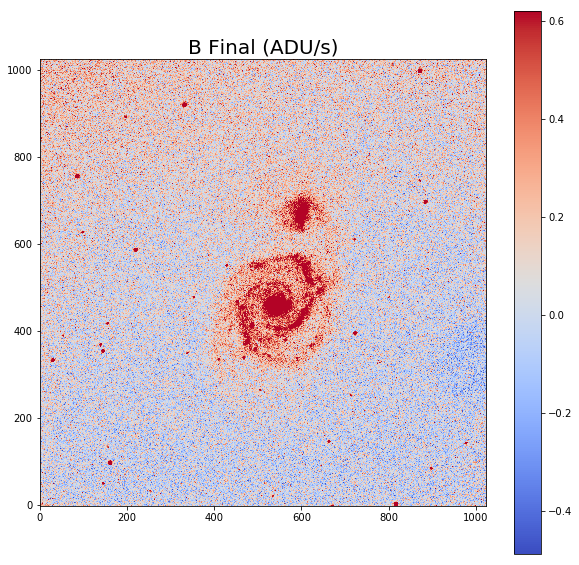

In [22]:
fig = plt.figure(figsize=((10,10)))
plt.title('B Final (ADU/s)', fontsize=20)
plt.imshow(B[0],vmin=B_median[0]-3*B_sigma[0],vmax=B_median[0]+3*B_sigma[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

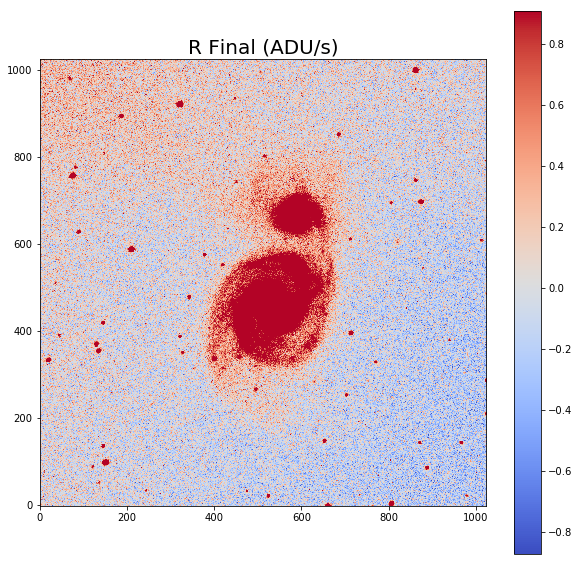

In [23]:
fig = plt.figure(figsize=((10,10)))
plt.title('R Final (ADU/s)', fontsize=20)
plt.imshow(R[0],vmin=R_median[0]-3*R_sigma[0],vmax=R_median[0]+3*R_sigma[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

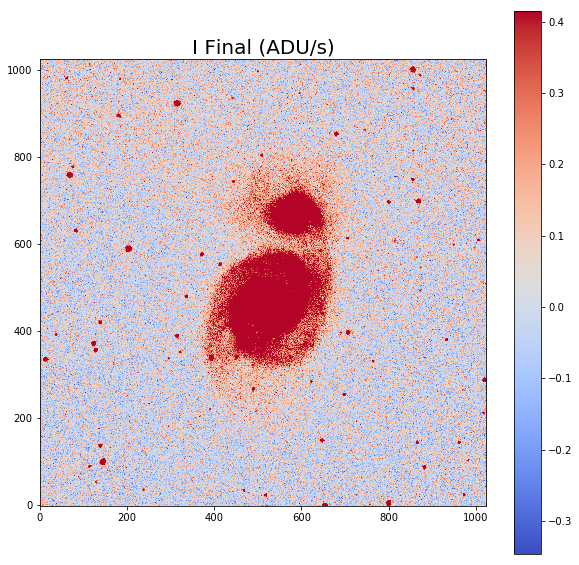

In [24]:
fig = plt.figure(figsize=((10,10)))
plt.title('I Final (ADU/s)', fontsize=20)
plt.imshow(I[0],vmin=I_median[0]-3*I_sigma[0],vmax=I_median[0]+3*I_sigma[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

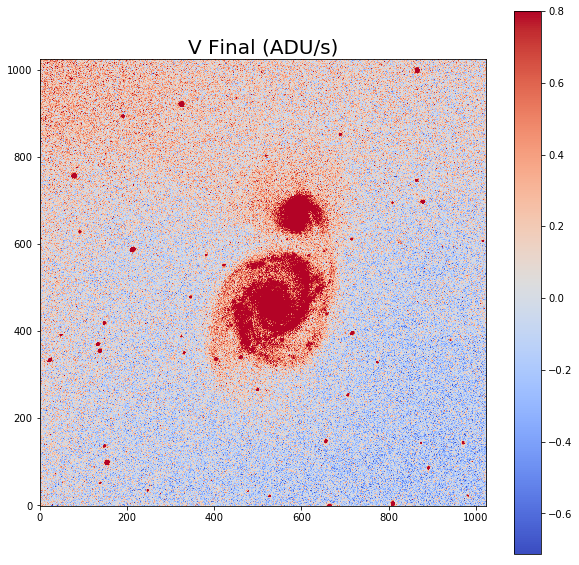

In [25]:
fig = plt.figure(figsize=((10,10)))
plt.title('V Final (ADU/s)', fontsize=20)
plt.imshow(V[0],vmin=V_median[0]-3*V_sigma[0],vmax=V_median[0]+3*V_sigma[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

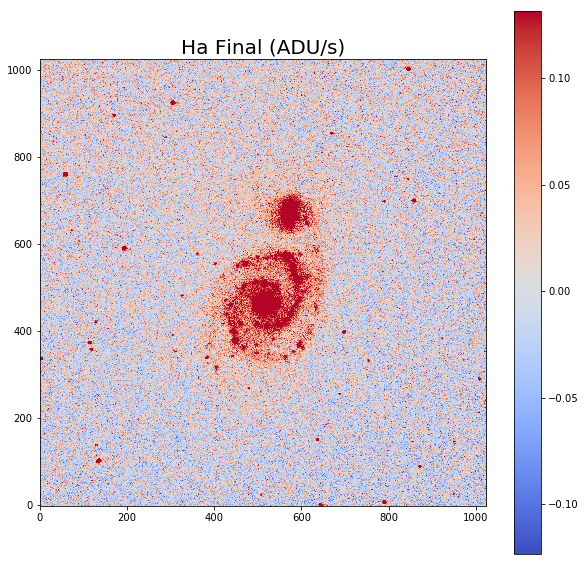

In [26]:
fig = plt.figure(figsize=((10,10)))
plt.title('Ha Final (ADU/s)', fontsize=20)
plt.imshow(Ha[0],vmin=Ha_median[0]-3*Ha_sigma[0],vmax=Ha_median[0]+3*Ha_sigma[0],cmap=plt.cm.coolwarm, origin='lower')
plt.colorbar()
plt.show()

In [27]:
#Save total frames

if B_frames:
    for i in range(len(B_final)):
        hdu_B_fin = fits.PrimaryHDU(B_final[i])
        hdul_B_fin = fits.HDUList([hdu_B_fin])
        hdu_B_fin.writeto('./Output/M51/M51_B_total_%02d.fits' %(i+1), overwrite='True')
    
if R_frames:
    for i in range(len(R_final)):
        hdu_R_fin = fits.PrimaryHDU(R_final[i])
        hdul_R_fin = fits.HDUList([hdu_R_fin])
        hdu_R_fin.writeto('./Output/M51/M51_R_total_%02d.fits' %(i+1), overwrite='True')
        
if I_frames:       
    for i in range(len(I_final)):
        hdu_I_fin = fits.PrimaryHDU(I_final[i])
        hdul_I_fin = fits.HDUList([hdu_I_fin])
        hdu_I_fin.writeto('./Output/M51/M51_I_total_%02d.fits' %(i+1), overwrite='True')

if V_frames:
    for i in range(len(V_final)):
        hdu_V_fin = fits.PrimaryHDU(V_final[i])
        hdul_V_fin = fits.HDUList([hdu_V_fin])
        hdu_V_fin.writeto('./Output/M51/M51_V_total_%02d.fits' %(i+1), overwrite='True')

if Ha_frames:
    for i in range(len(Ha_final)):
        hdu_Ha_fin = fits.PrimaryHDU(Ha_final[i])
        hdul_Ha_fin = fits.HDUList([hdu_Ha_fin])
        hdu_Ha_fin.writeto('./Output/M51/M51_Ha_total_%02d.fits' %(i+1), overwrite='True')

In [28]:
#Save per second frames

if B_frames:
    for i in range(len(B_final)):
        hdu_B_fin = fits.PrimaryHDU(B[i])
        hdul_B_fin = fits.HDUList([hdu_B_fin])
        hdu_B_fin.writeto('./Output/M51/M51_B_norm_%02d.fits' %(i+1), overwrite='True')
    
if R_frames:
    for i in range(len(R_final)):
        hdu_R_fin = fits.PrimaryHDU(R[i])
        hdul_R_fin = fits.HDUList([hdu_R_fin])
        hdu_R_fin.writeto('./Output/M51/M51_R_norm_%02d.fits' %(i+1), overwrite='True')
        
if I_frames:       
    for i in range(len(I_final)):
        hdu_I_fin = fits.PrimaryHDU(I[i])
        hdul_I_fin = fits.HDUList([hdu_I_fin])
        hdu_I_fin.writeto('./Output/M51/M51_I_norm_%02d.fits' %(i+1), overwrite='True')

if V_frames:
    for i in range(len(V_final)):
        hdu_V_fin = fits.PrimaryHDU(V[i])
        hdul_V_fin = fits.HDUList([hdu_V_fin])
        hdu_V_fin.writeto('./Output/M51/M51_V_norm_%02d.fits' %(i+1), overwrite='True')

if Ha_frames:
    for i in range(len(Ha_final)):
        hdu_Ha_fin = fits.PrimaryHDU(Ha[i])
        hdul_Ha_fin = fits.HDUList([hdu_Ha_fin])
        hdu_Ha_fin.writeto('./Output/M51/M51_Ha_norm_%02d.fits' %(i+1), overwrite='True')

# Done